In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
from transformers import AutoModelForCausalLM, AutoTokenizer

from core.utils.device import DEVICE
from core.utils.theme import set_theme

set_theme()

model = AutoModelForCausalLM.from_pretrained("google/gemma-3-1b-pt")
model.to(DEVICE)
model.eval()
tokenizer = AutoTokenizer.from_pretrained("google/gemma-3-1b-pt")

# EN-RU


Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Data len:  100


100%|██████████| 100/100 [00:27<00:00,  3.65it/s]


Data len:  100


100%|██████████| 100/100 [00:19<00:00,  5.04it/s]
/Users/aigoncharov/dev/plato-meets-llms__ideas-vs-lexical-reflections/src/core/steering/pca.py:39: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:256.)
  self.pca_components = torch.tensor(pca_components)


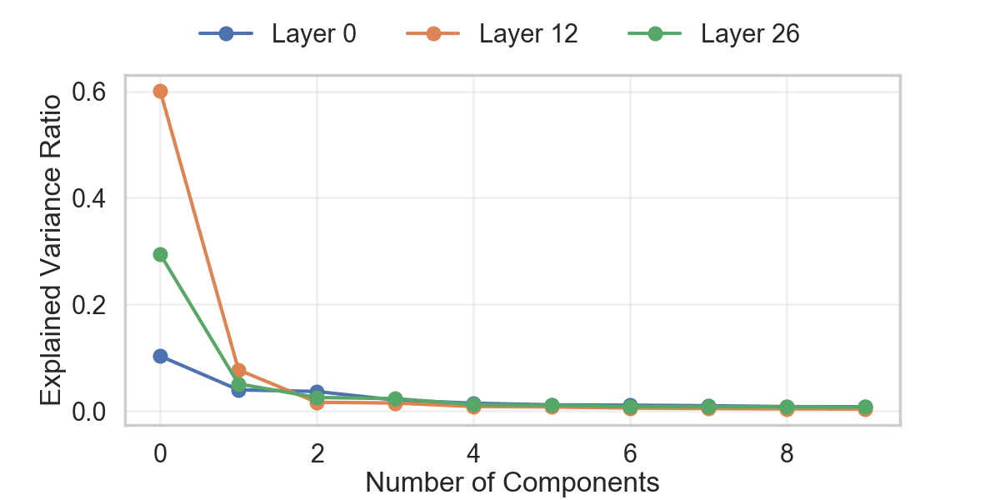

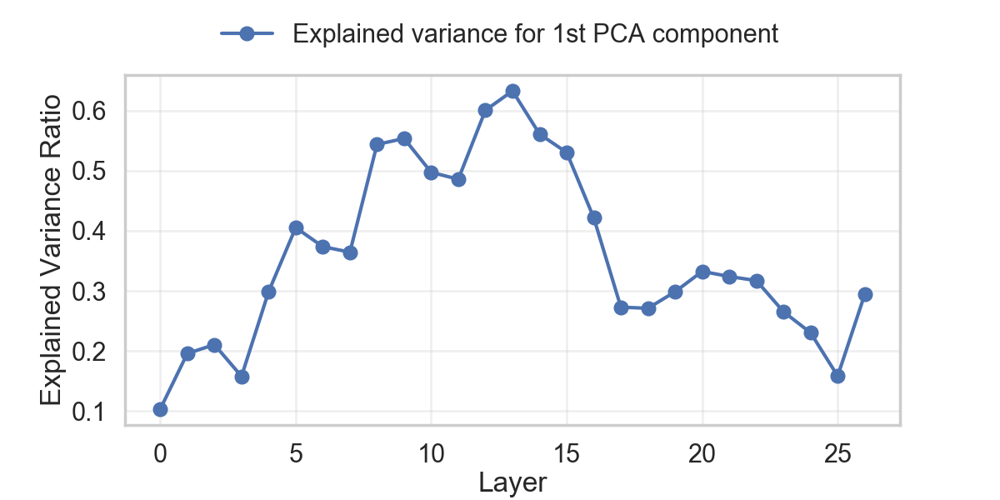

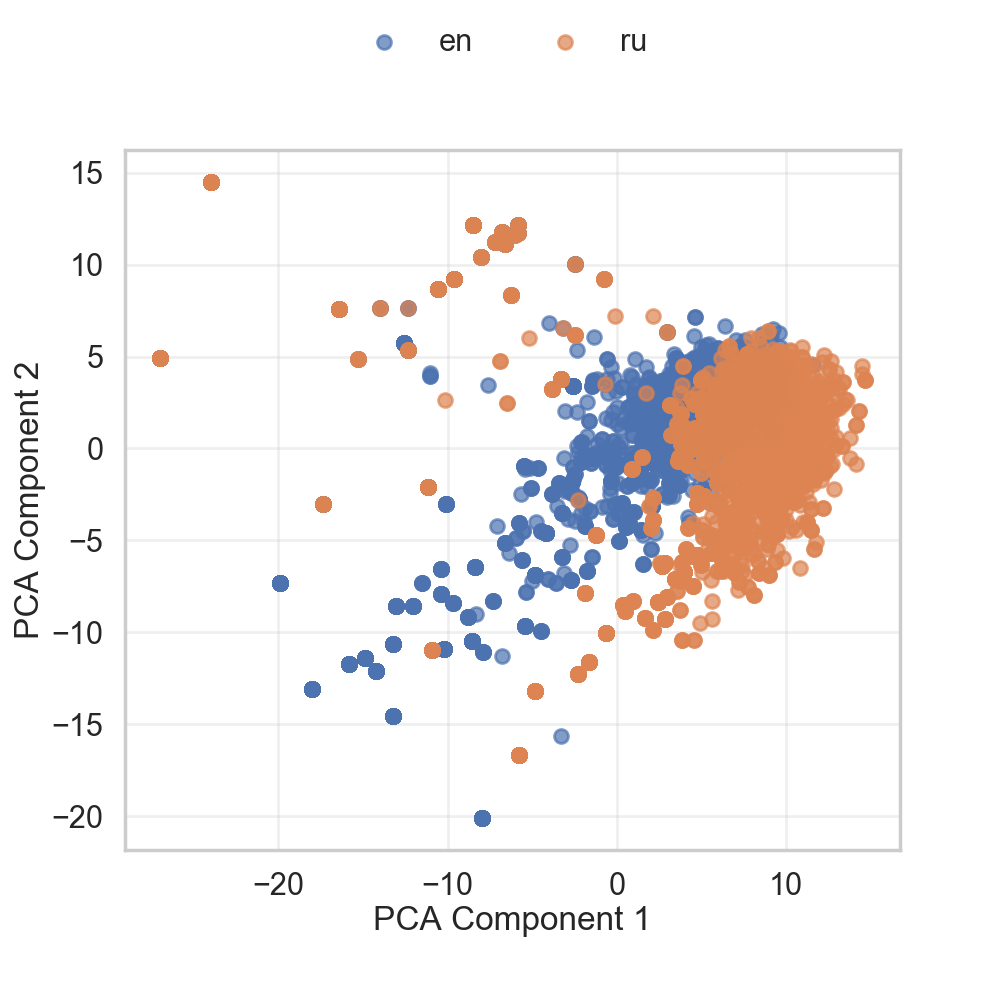

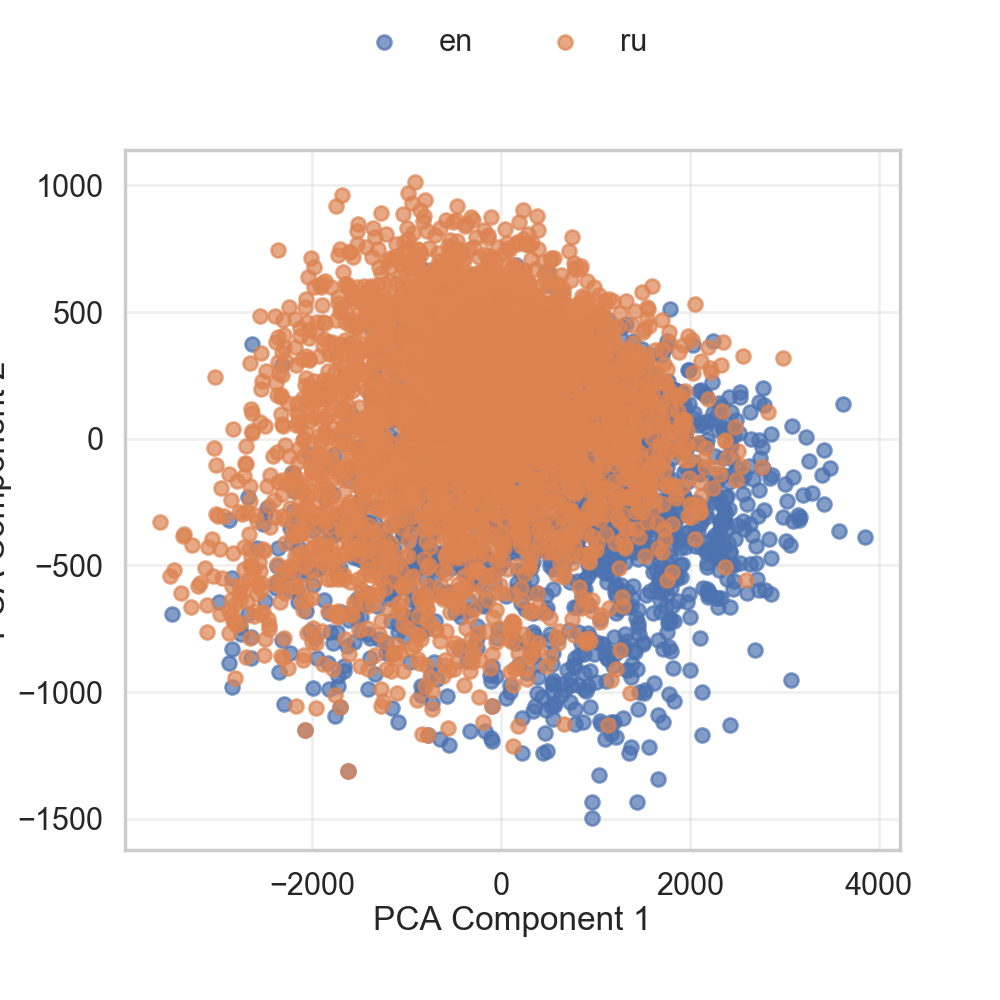

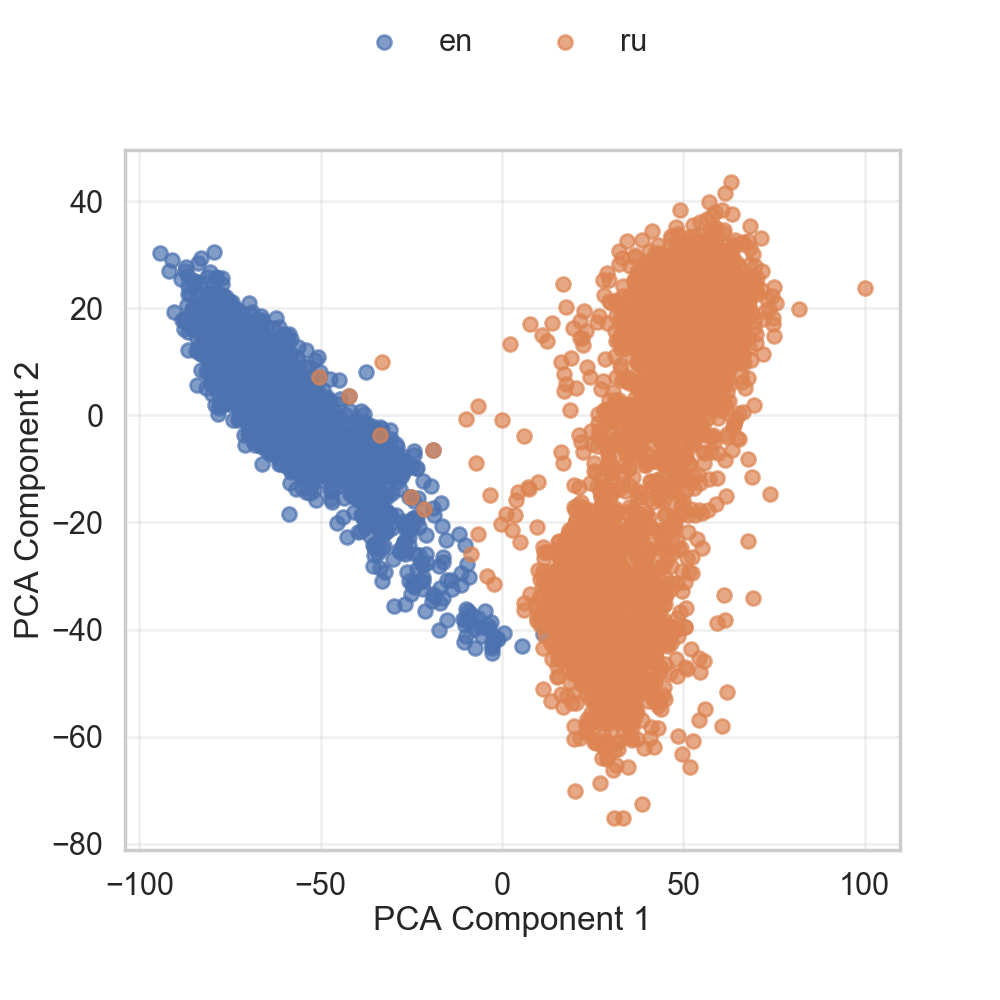

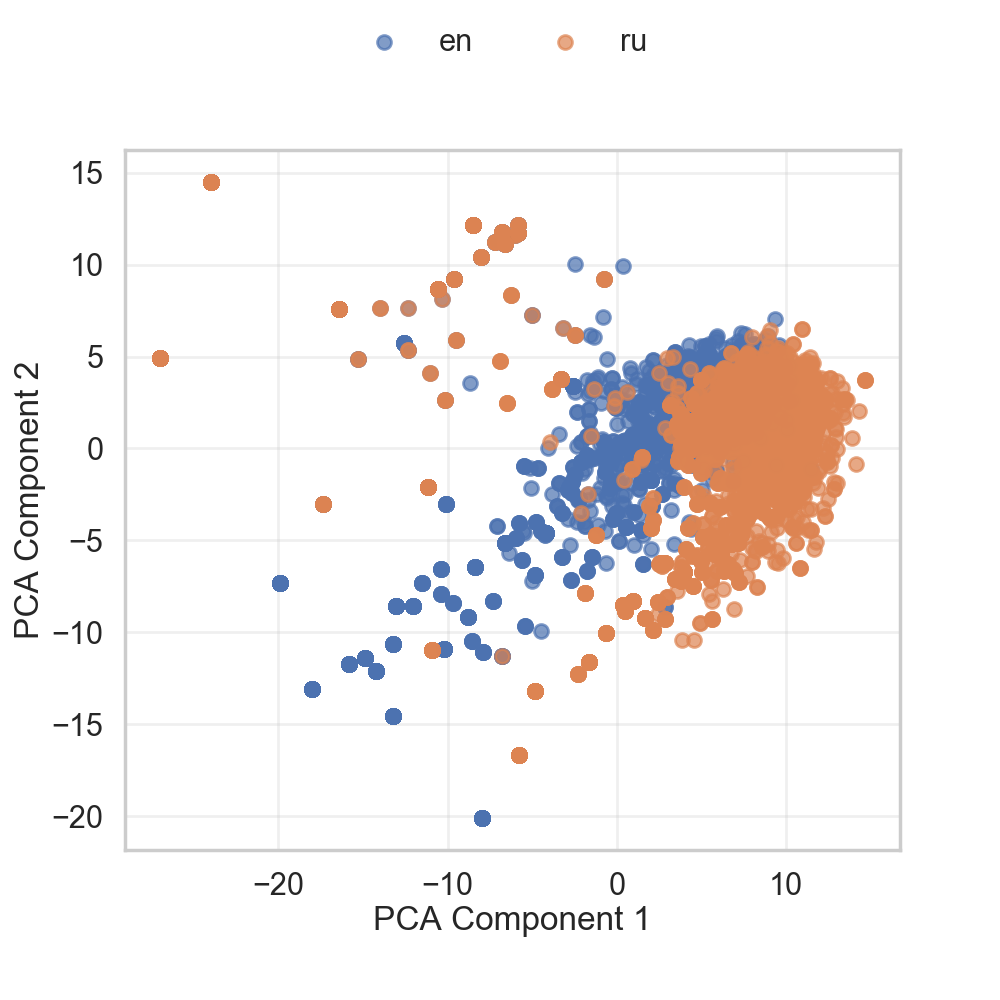

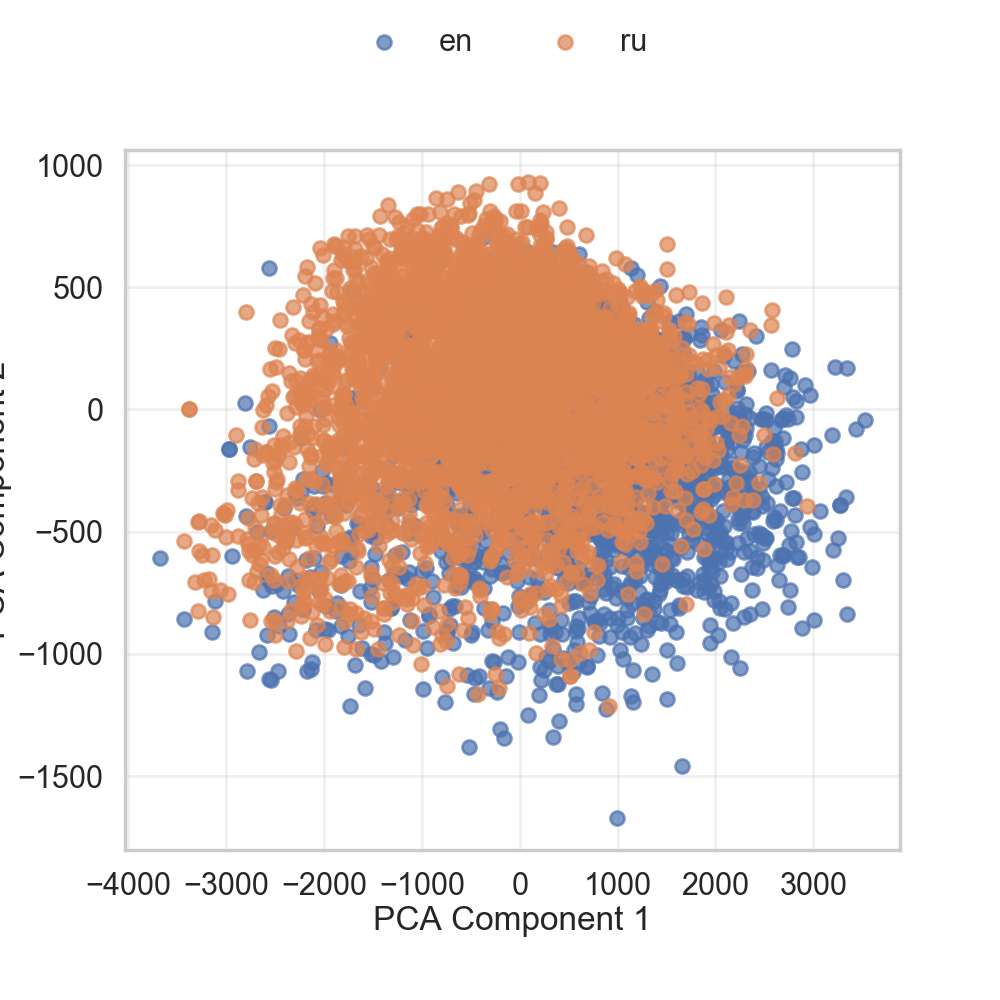

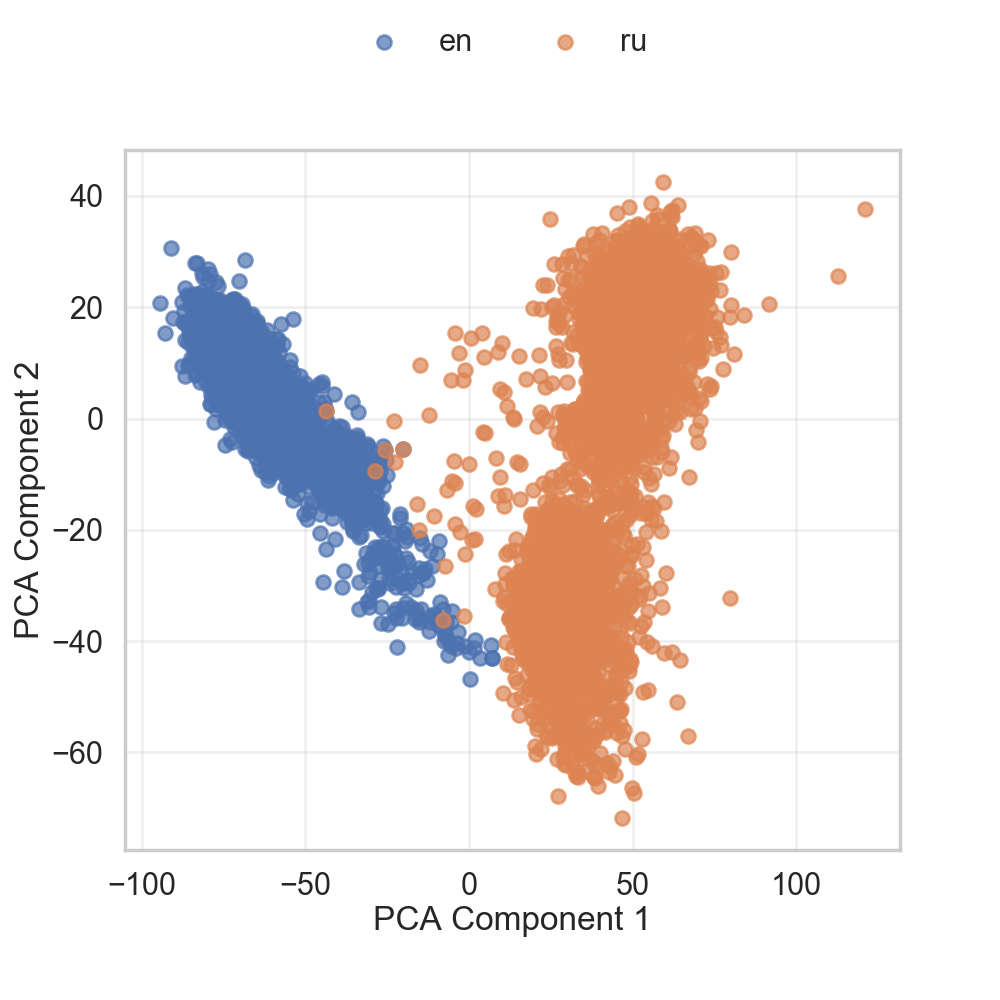

In [3]:
from core.gather_data.hidden_space import collect_hidden_space_by_language
from core.preprocess_data.flores_plus import load_flores_plus
from core.steering.pca import PCASteering
from core.visualize.visualize_explained_variance import visualize_explained_variance
from core.visualize.visualize_projections import visualize_projections

train_df, test_df = load_flores_plus(["eng_Latn", "rus_Cyrl"], {"eng_Latn": "en", "rus_Cyrl": "ru"}, train_size=100)

test_df = test_df[:100]

hidden_space_by_language_train, token_map_for_language_train = collect_hidden_space_by_language(
    model, tokenizer, train_df, skip_first=True
)
hidden_space_by_language_test, token_map_for_language_test = collect_hidden_space_by_language(
    model, tokenizer, test_df, skip_first=True
)

pca_steering = PCASteering().fit(hidden_space_by_language_train)
visualize_explained_variance(
    pca_steering.explained_variance_ratios, save_to="../../../artifacts/language_map/en_ru/gemma"
)

projections_train = pca_steering.project(hidden_space_by_language_train)
visualize_projections(hidden_space_by_language_train, token_map_for_language_train, projections_train, tokenizer)

projections_test = pca_steering.project(hidden_space_by_language_test)
visualize_projections(
    hidden_space_by_language_test,
    token_map_for_language_test,
    projections_test,
    tokenizer,
    save_to="../../../artifacts/language_map/en_ru/gemma",
)

# EN-CN


Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Data len:  100


100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Data len:  100


100%|██████████| 100/100 [00:16<00:00,  5.97it/s]


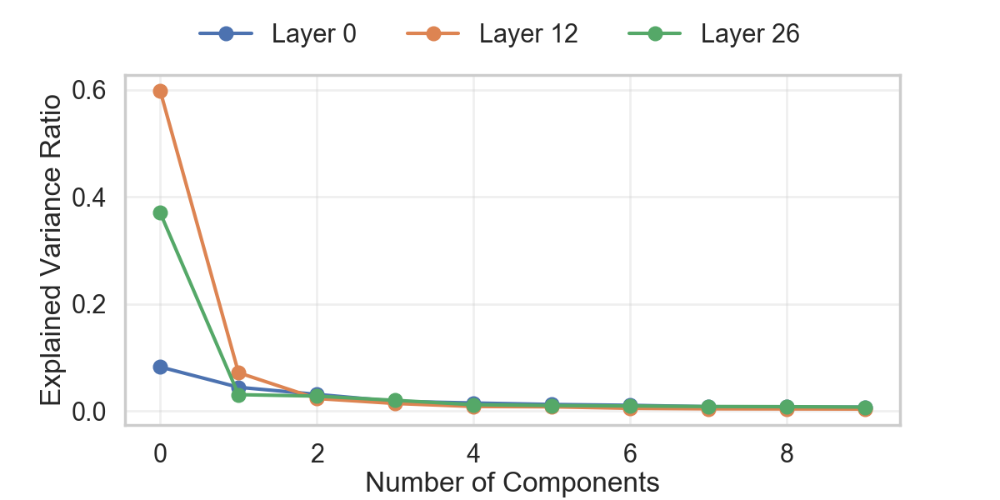

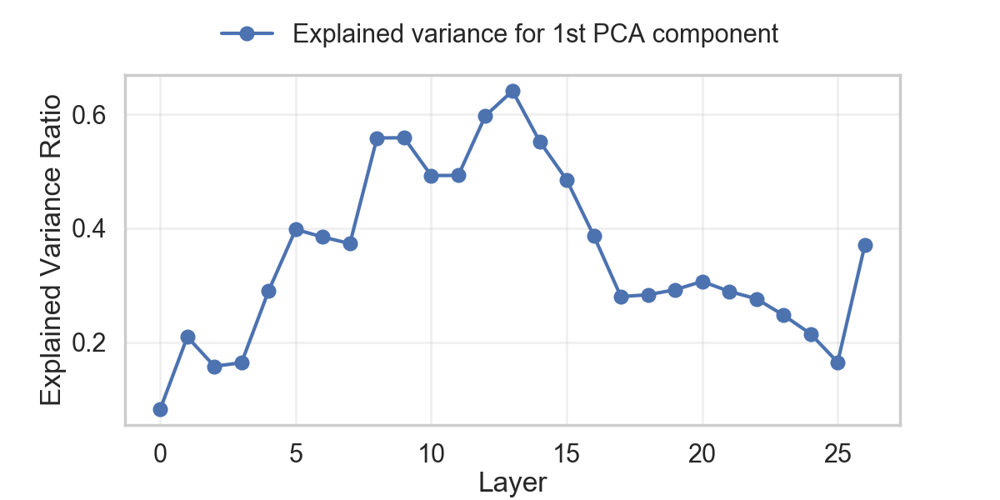

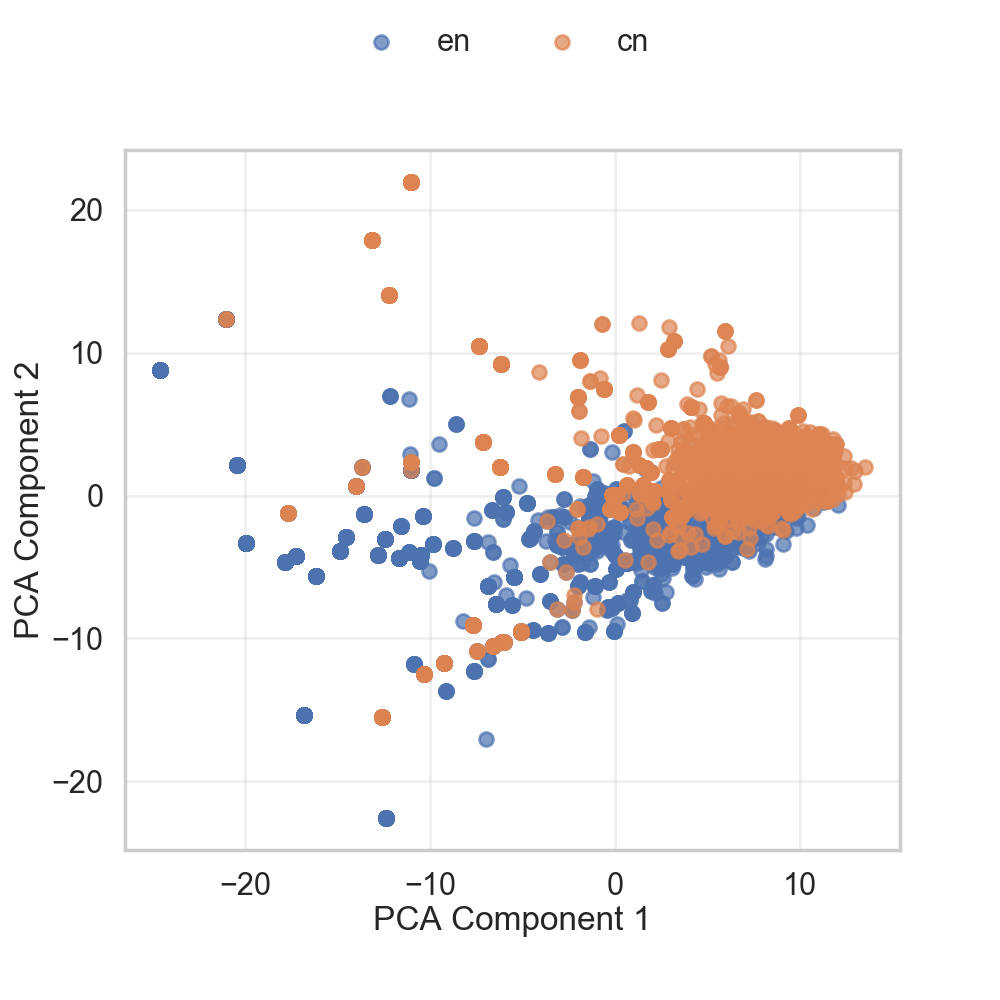

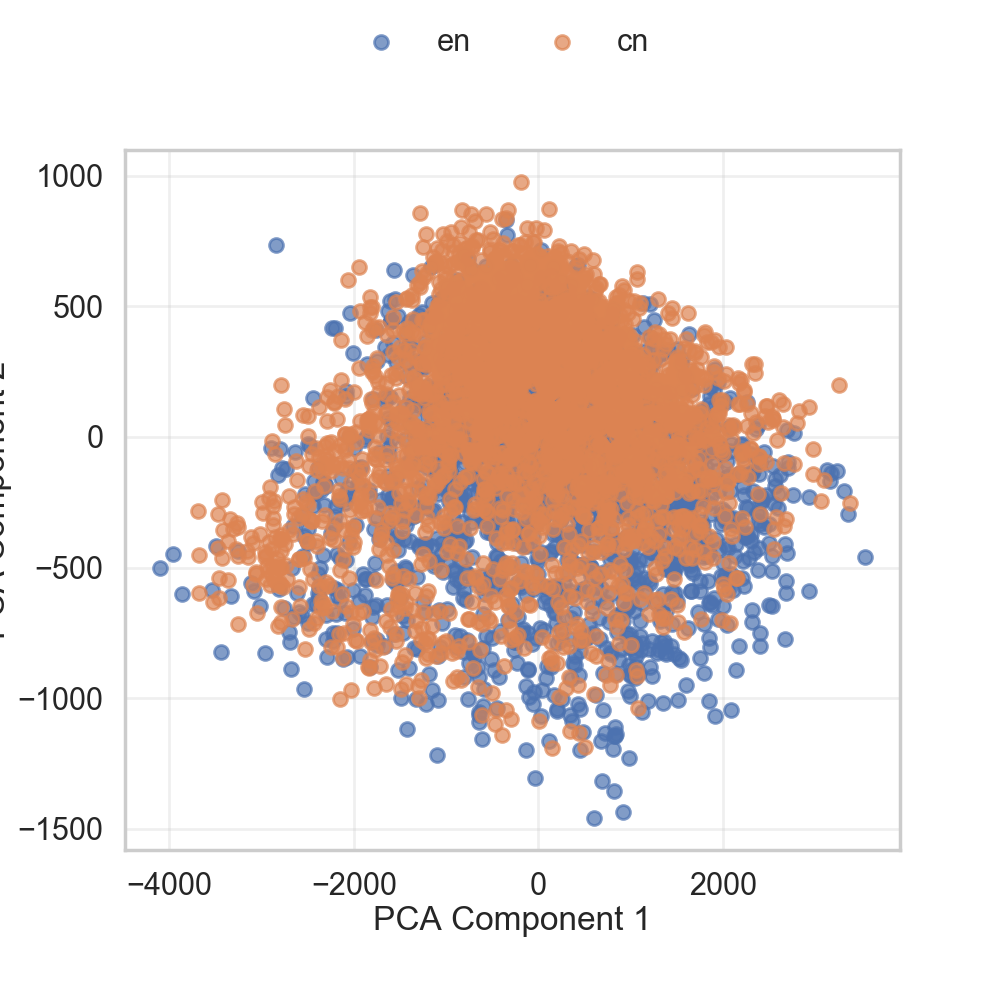

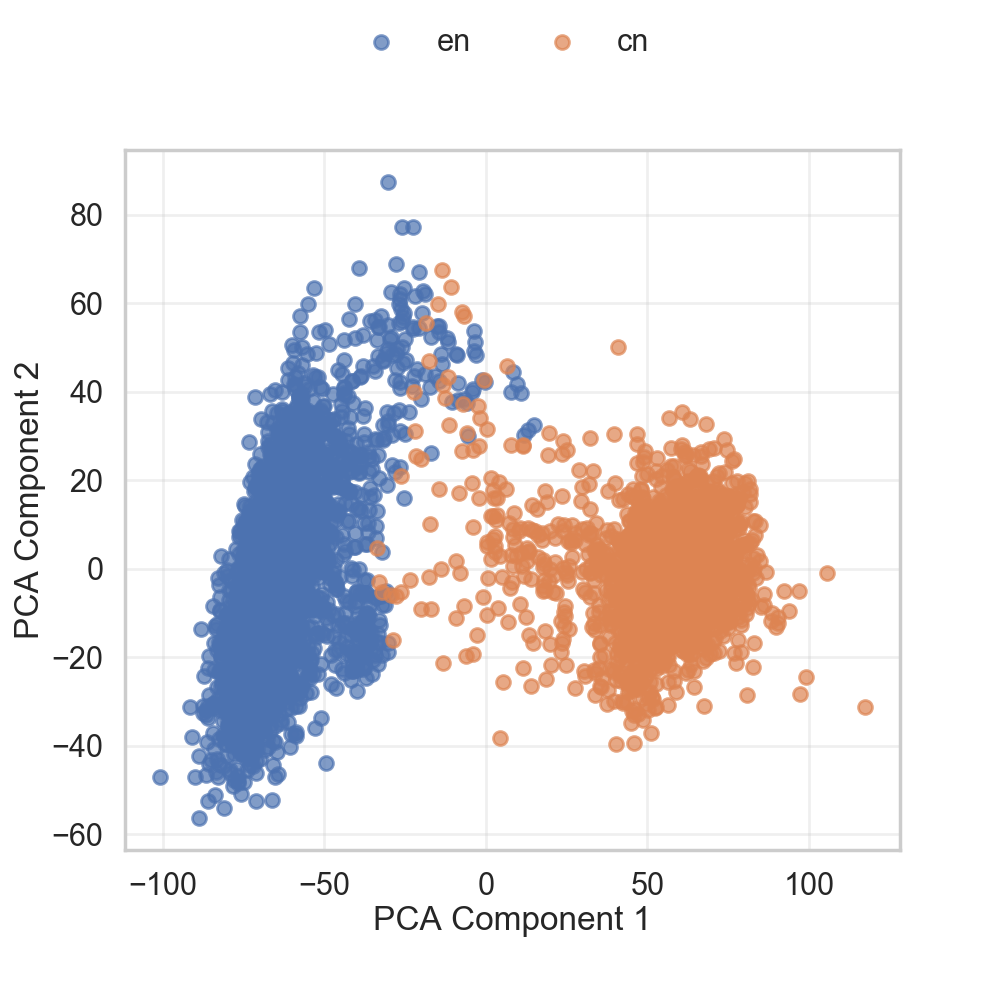

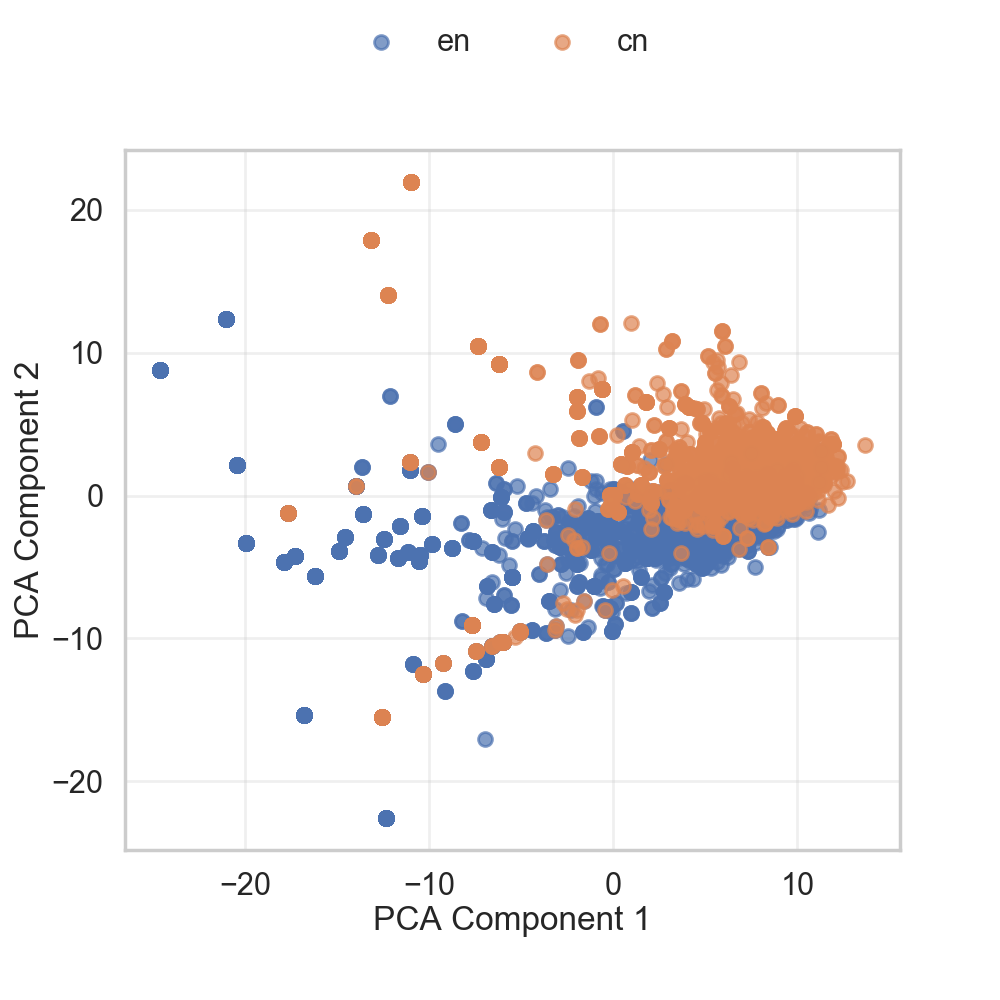

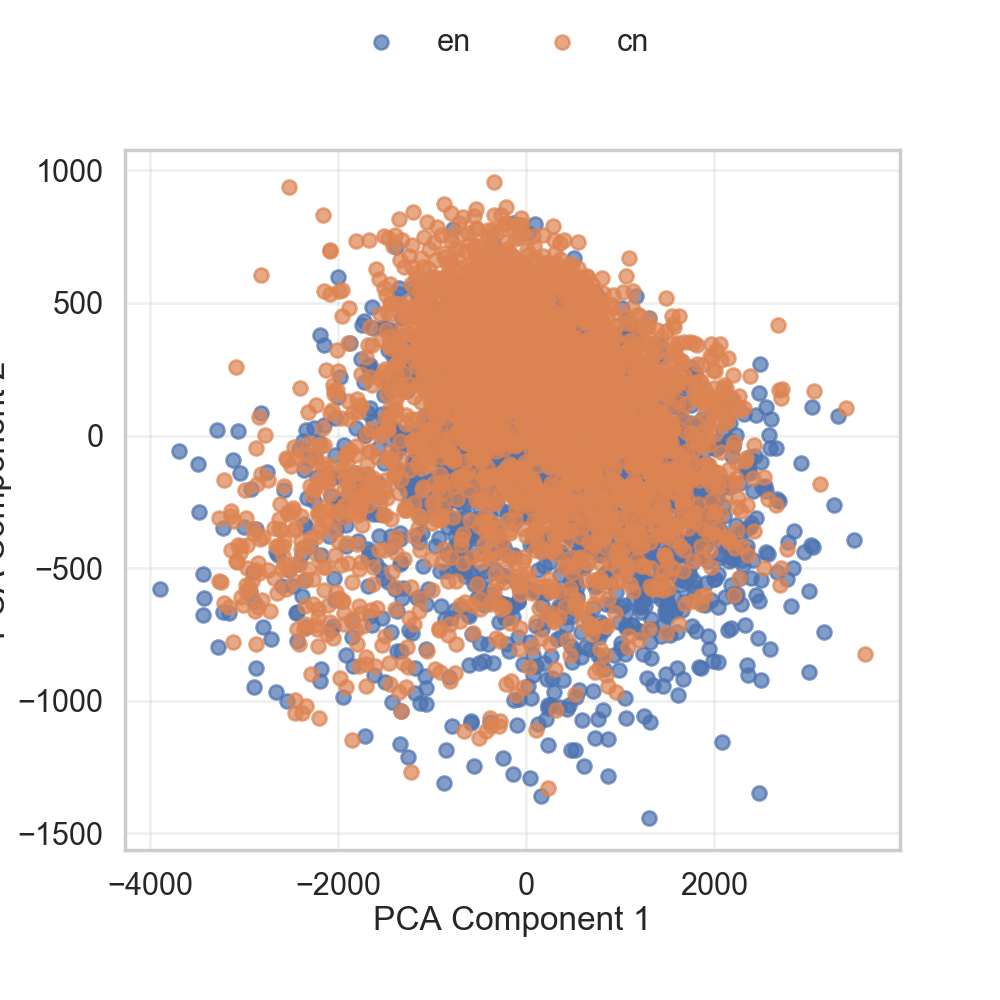

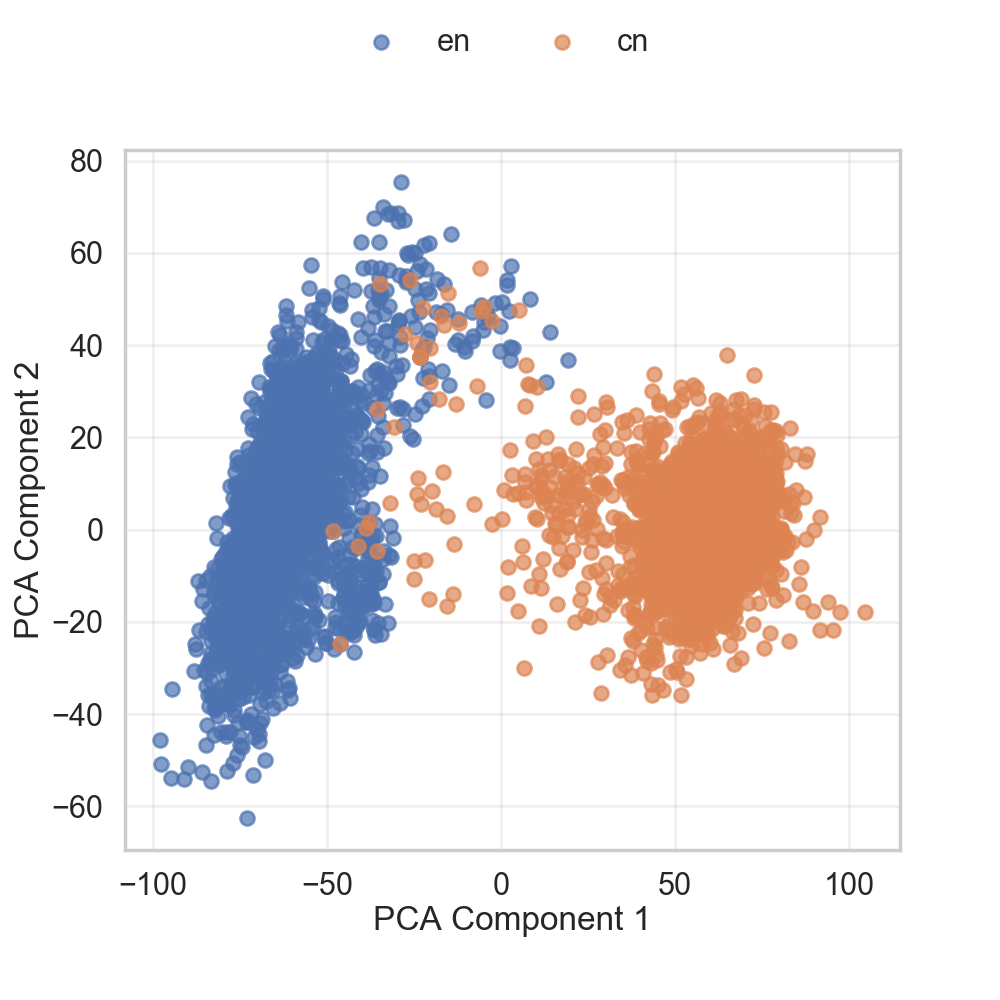

In [4]:
from core.gather_data.hidden_space import collect_hidden_space_by_language
from core.preprocess_data.flores_plus import load_flores_plus
from core.steering.pca import PCASteering
from core.visualize.visualize_explained_variance import visualize_explained_variance
from core.visualize.visualize_projections import visualize_projections

train_df, test_df = load_flores_plus(["eng_Latn", "cmn_Hans"], {"eng_Latn": "en", "cmn_Hans": "cn"}, train_size=100)

test_df = test_df[:100]

hidden_space_by_language_train, token_map_for_language_train = collect_hidden_space_by_language(
    model, tokenizer, train_df, skip_first=True
)
hidden_space_by_language_test, token_map_for_language_test = collect_hidden_space_by_language(
    model, tokenizer, test_df, skip_first=True
)

pca_steering = PCASteering().fit(hidden_space_by_language_train)
visualize_explained_variance(
    pca_steering.explained_variance_ratios, save_to="../../../artifacts/language_map/en_cn/gemma"
)

projections_train = pca_steering.project(hidden_space_by_language_train)
visualize_projections(hidden_space_by_language_train, token_map_for_language_train, projections_train, tokenizer)

projections_test = pca_steering.project(hidden_space_by_language_test)
visualize_projections(
    hidden_space_by_language_test,
    token_map_for_language_test,
    projections_test,
    tokenizer,
    save_to="../../../artifacts/language_map/en_cn/gemma",
)

# EN-ES


Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Data len:  100


100%|██████████| 100/100 [00:17<00:00,  5.59it/s]


Data len:  100


100%|██████████| 100/100 [00:22<00:00,  4.43it/s]


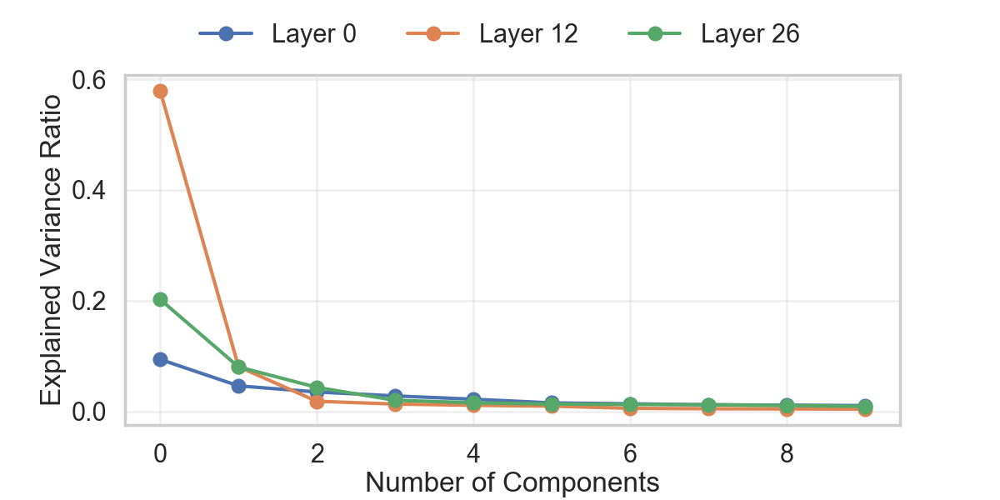

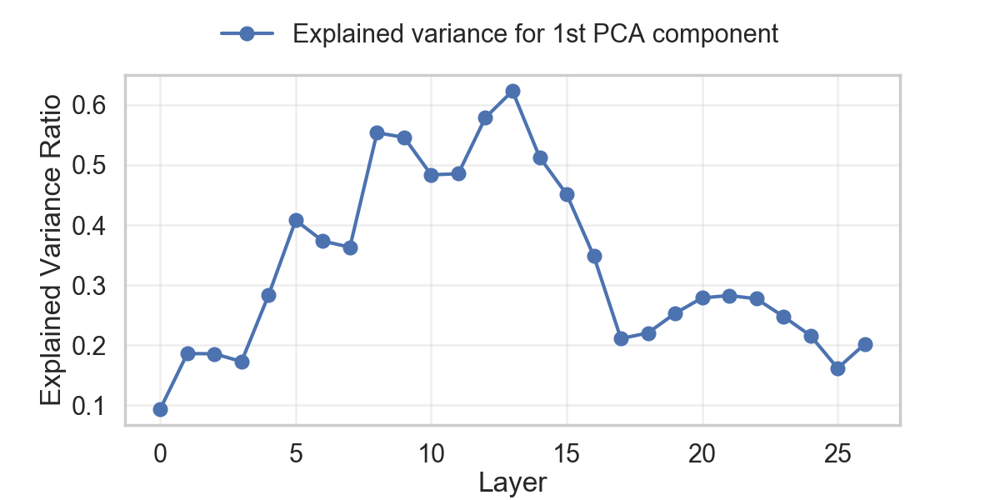

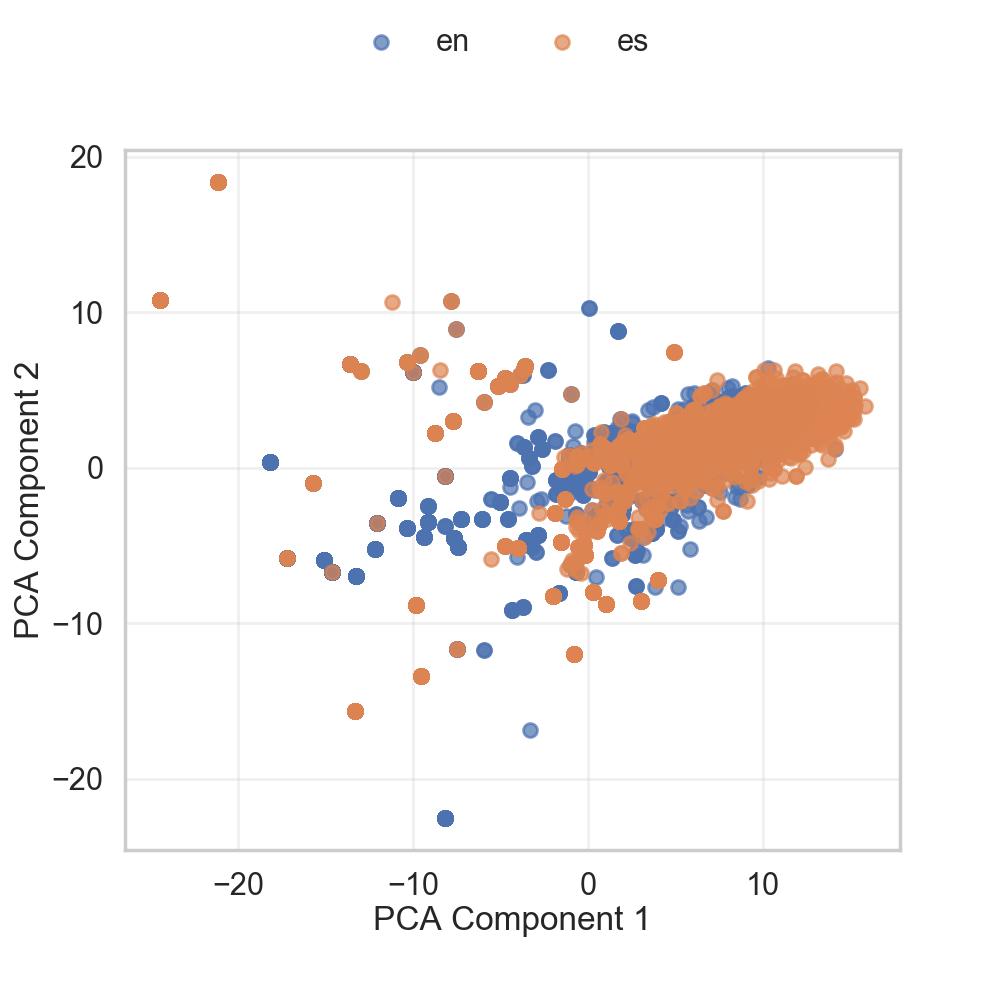

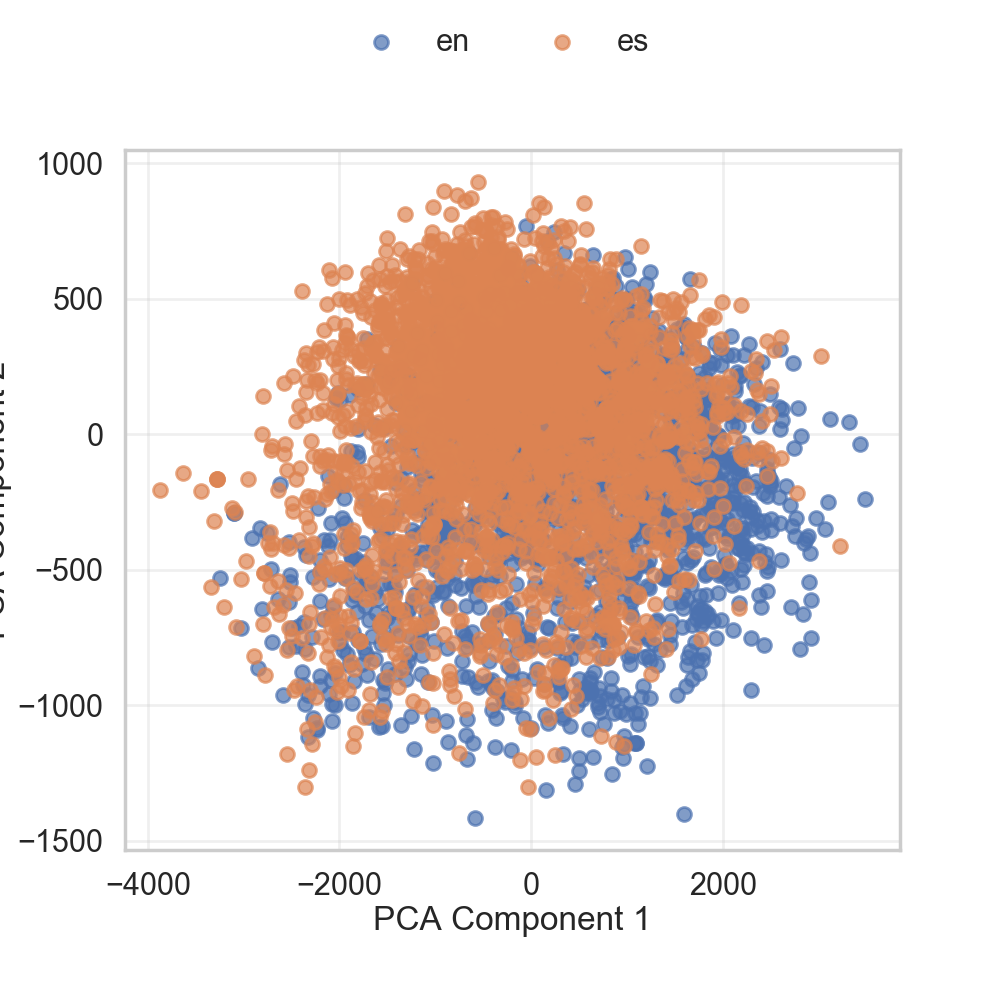

/Users/aigoncharov/dev/plato-meets-llms__ideas-vs-lexical-reflections/src/core/visualize/visualize_projections.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 10))


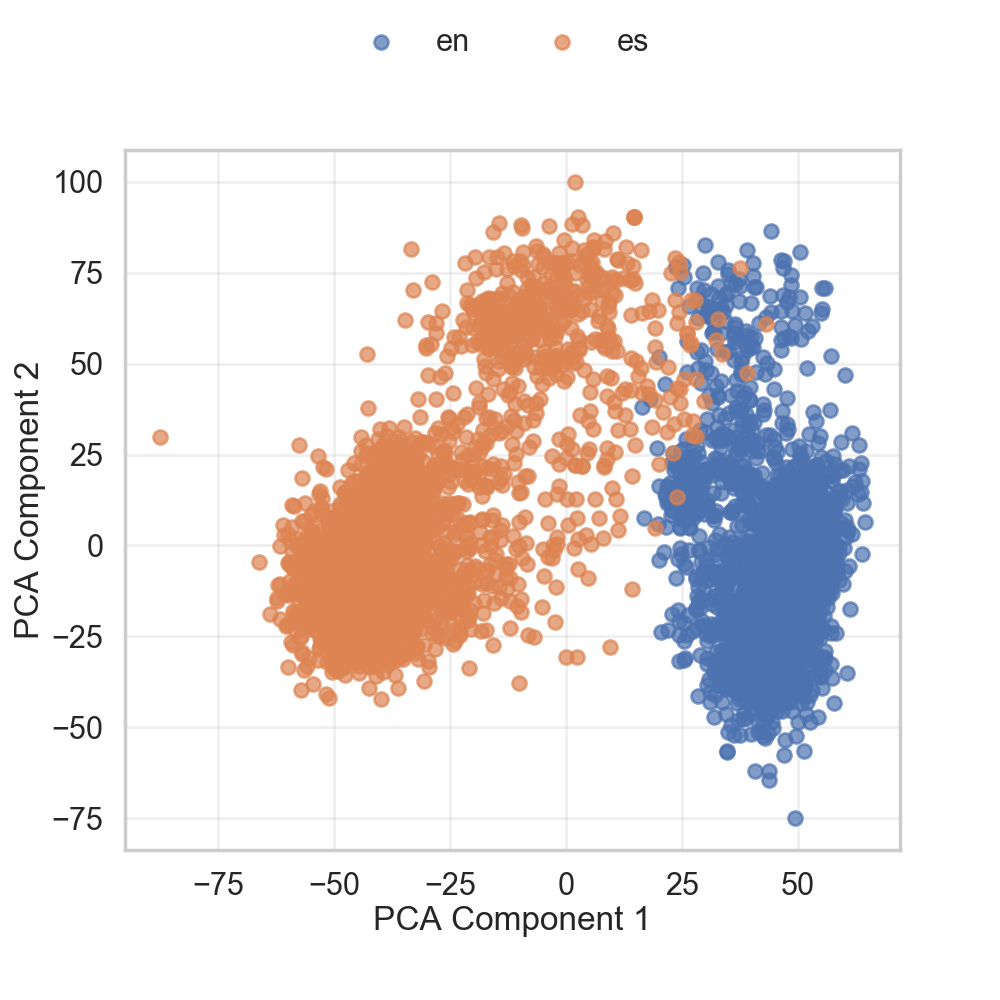

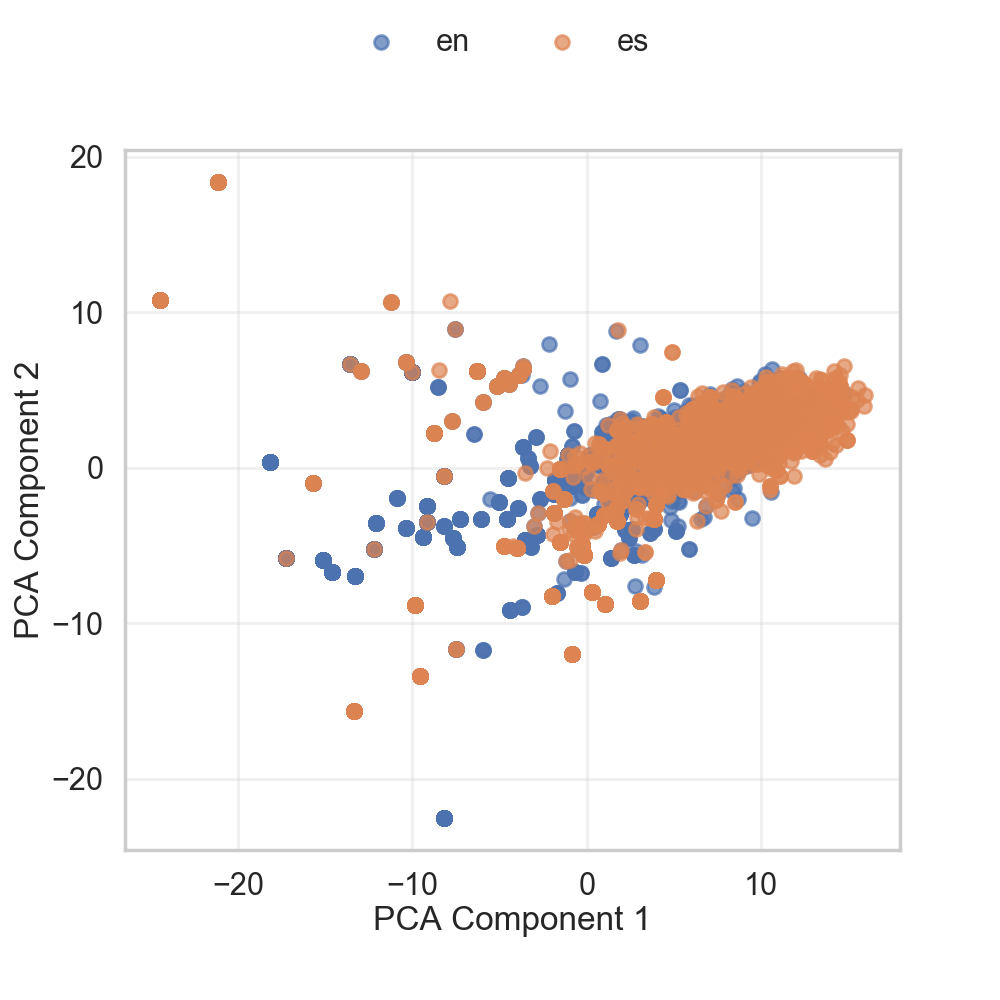

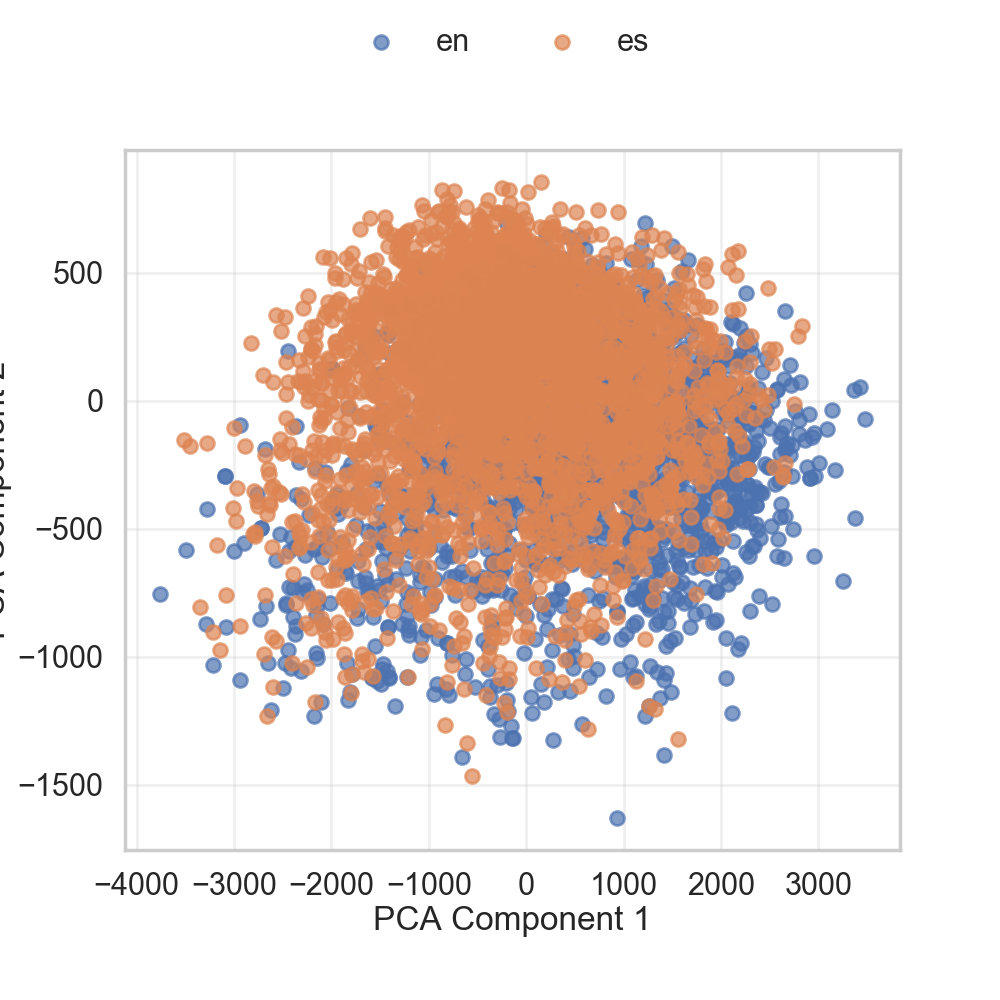

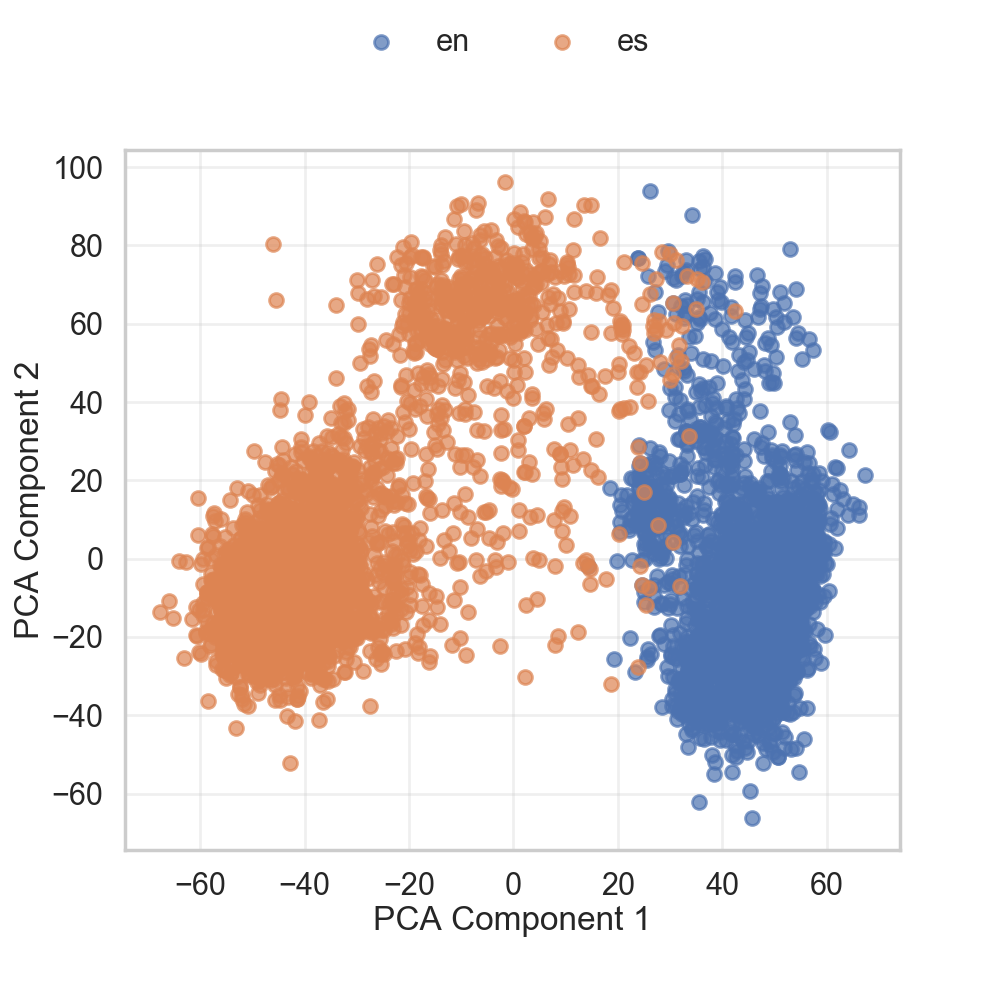

In [5]:
from core.gather_data.hidden_space import collect_hidden_space_by_language
from core.preprocess_data.flores_plus import load_flores_plus
from core.steering.pca import PCASteering
from core.visualize.visualize_explained_variance import visualize_explained_variance
from core.visualize.visualize_projections import visualize_projections

train_df, test_df = load_flores_plus(["eng_Latn", "spa_Latn"], {"eng_Latn": "en", "spa_Latn": "es"}, train_size=100)

test_df = test_df[:100]

hidden_space_by_language_train, token_map_for_language_train = collect_hidden_space_by_language(
    model, tokenizer, train_df, skip_first=True
)
hidden_space_by_language_test, token_map_for_language_test = collect_hidden_space_by_language(
    model, tokenizer, test_df, skip_first=True
)

pca_steering = PCASteering().fit(hidden_space_by_language_train)
visualize_explained_variance(
    pca_steering.explained_variance_ratios, save_to="../../../artifacts/language_map/en_cn/gemma"
)

projections_train = pca_steering.project(hidden_space_by_language_train)
visualize_projections(hidden_space_by_language_train, token_map_for_language_train, projections_train, tokenizer)

projections_test = pca_steering.project(hidden_space_by_language_test)
visualize_projections(
    hidden_space_by_language_test,
    token_map_for_language_test,
    projections_test,
    tokenizer,
    save_to="../../../artifacts/language_map/en_es/gemma",
)

# Multi


Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/220 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/214 [00:00<?, ?it/s]

Data len:  100


100%|██████████| 100/100 [00:48<00:00,  2.04it/s]


Data len:  100


100%|██████████| 100/100 [00:46<00:00,  2.14it/s]


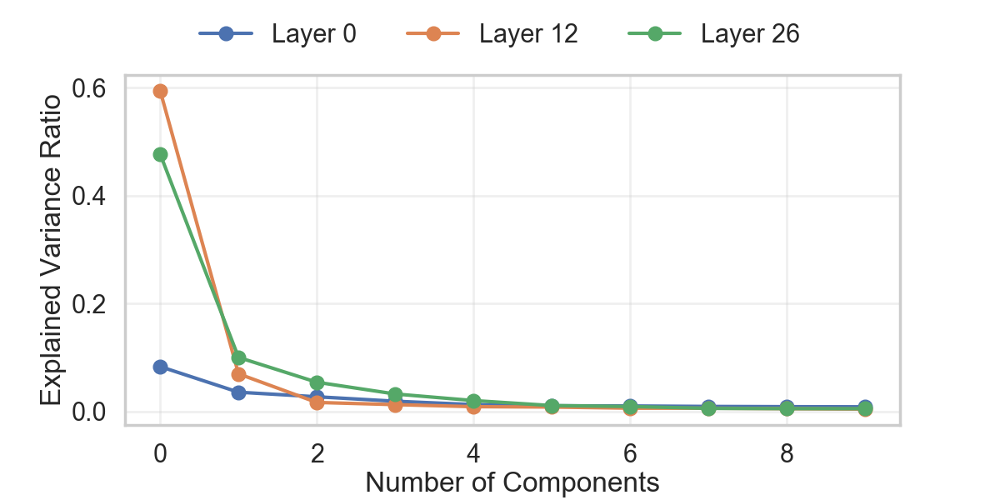

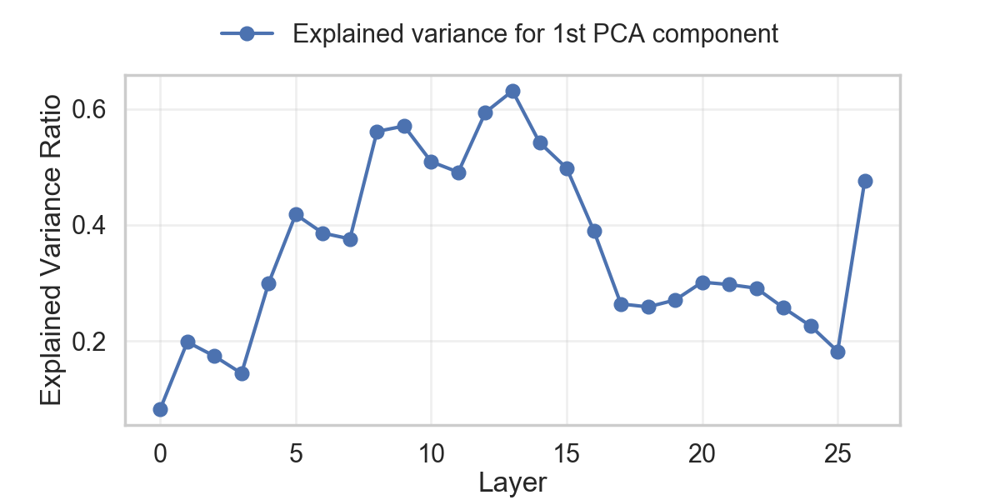

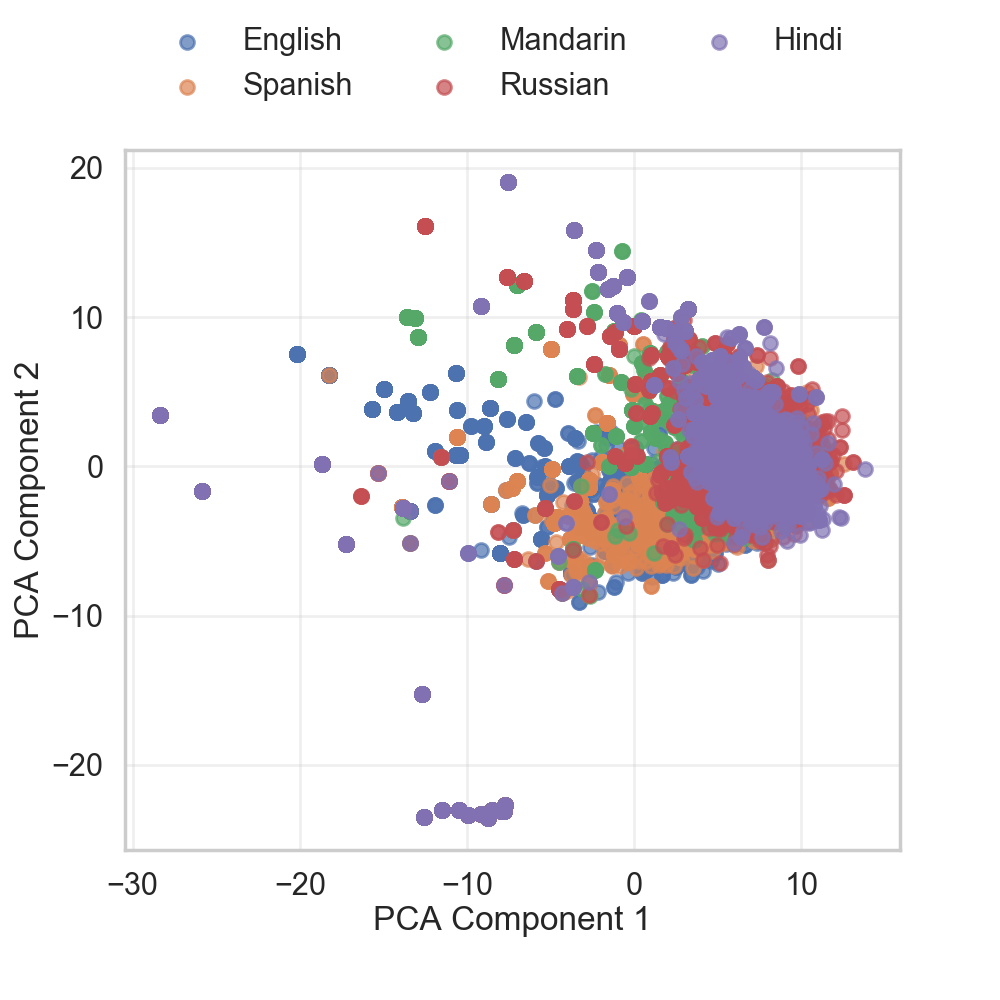

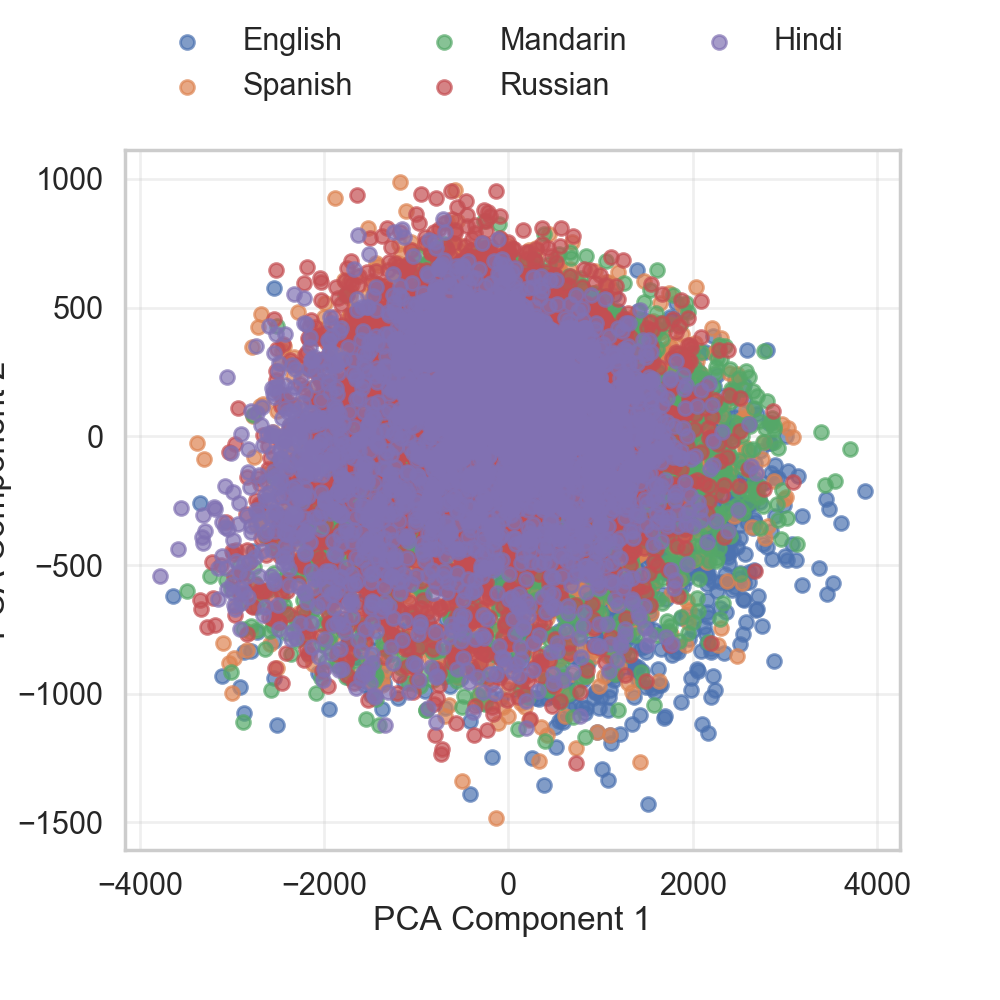

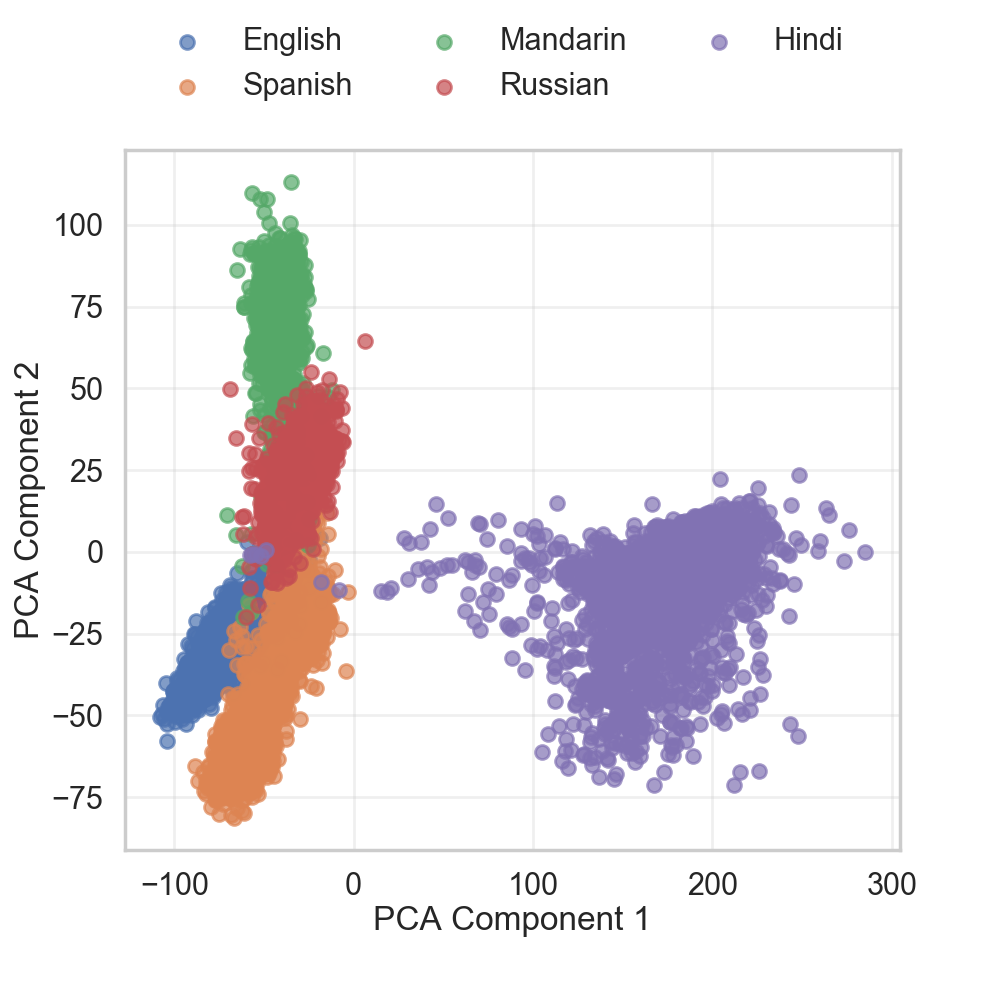

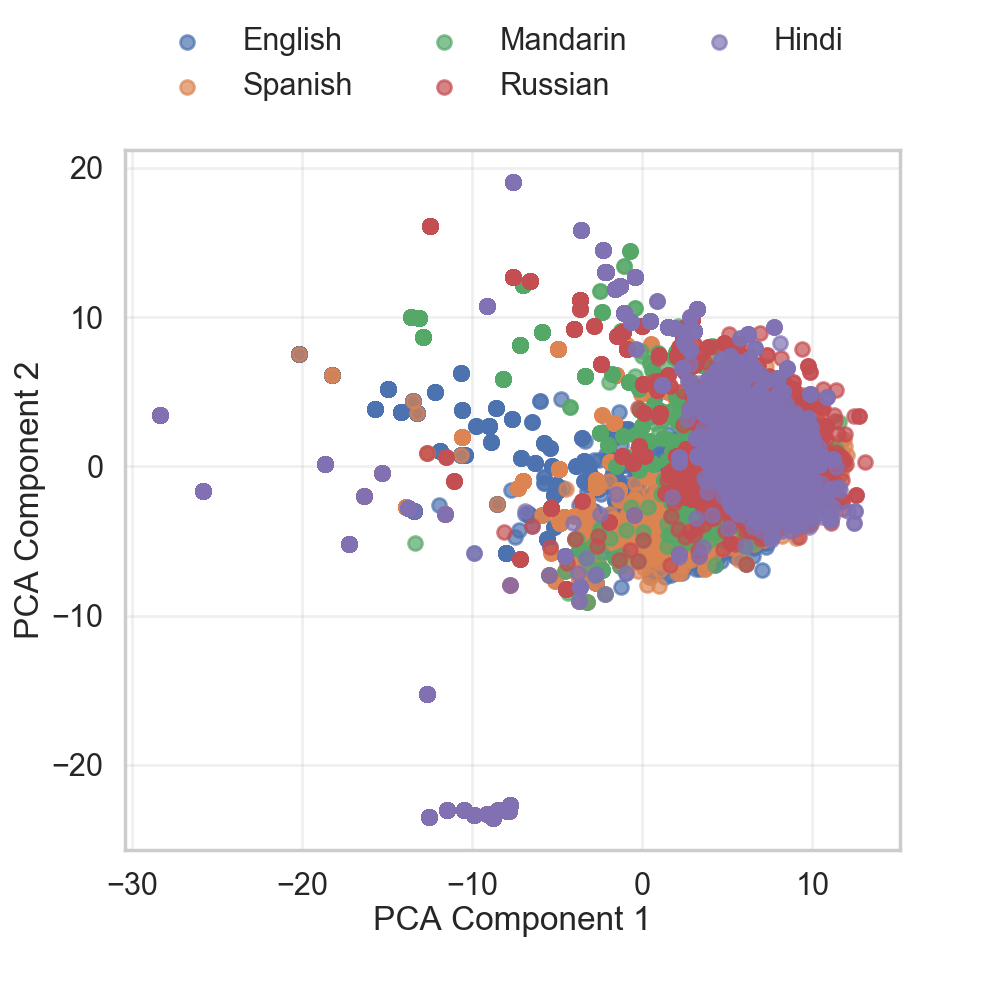

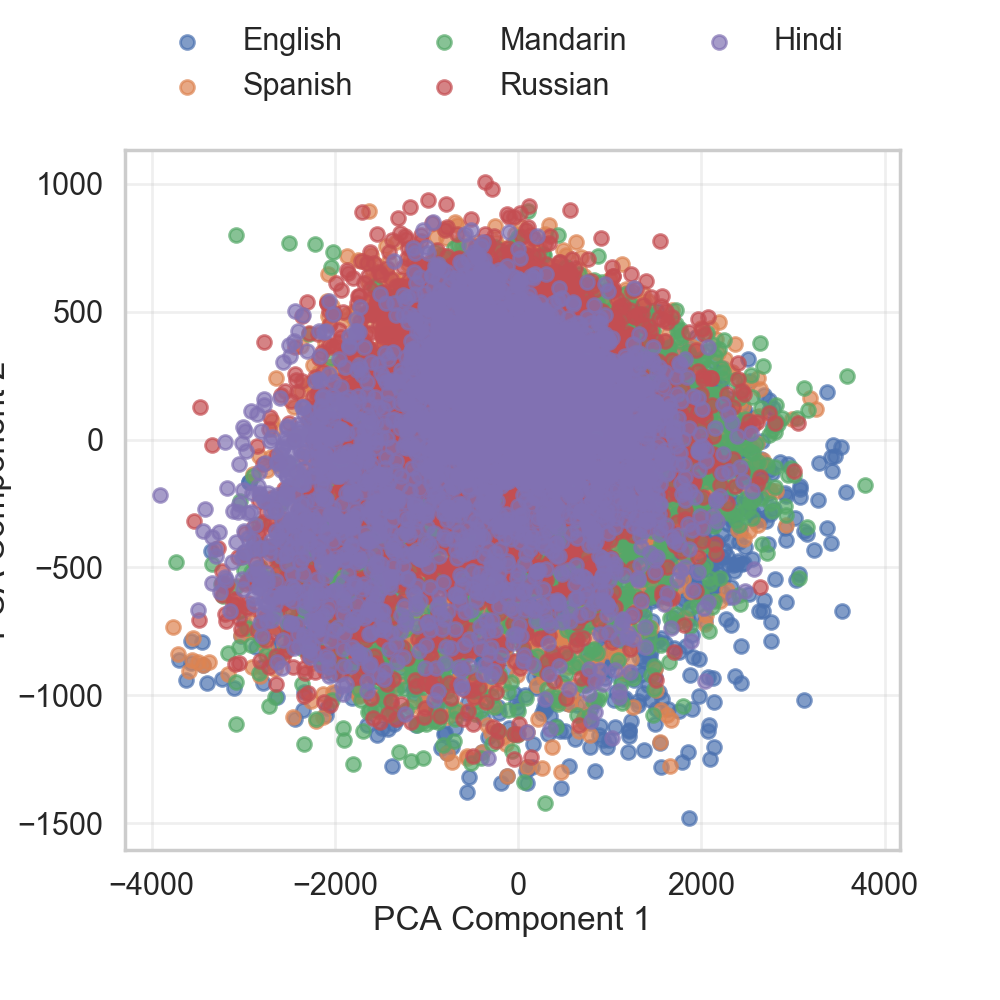

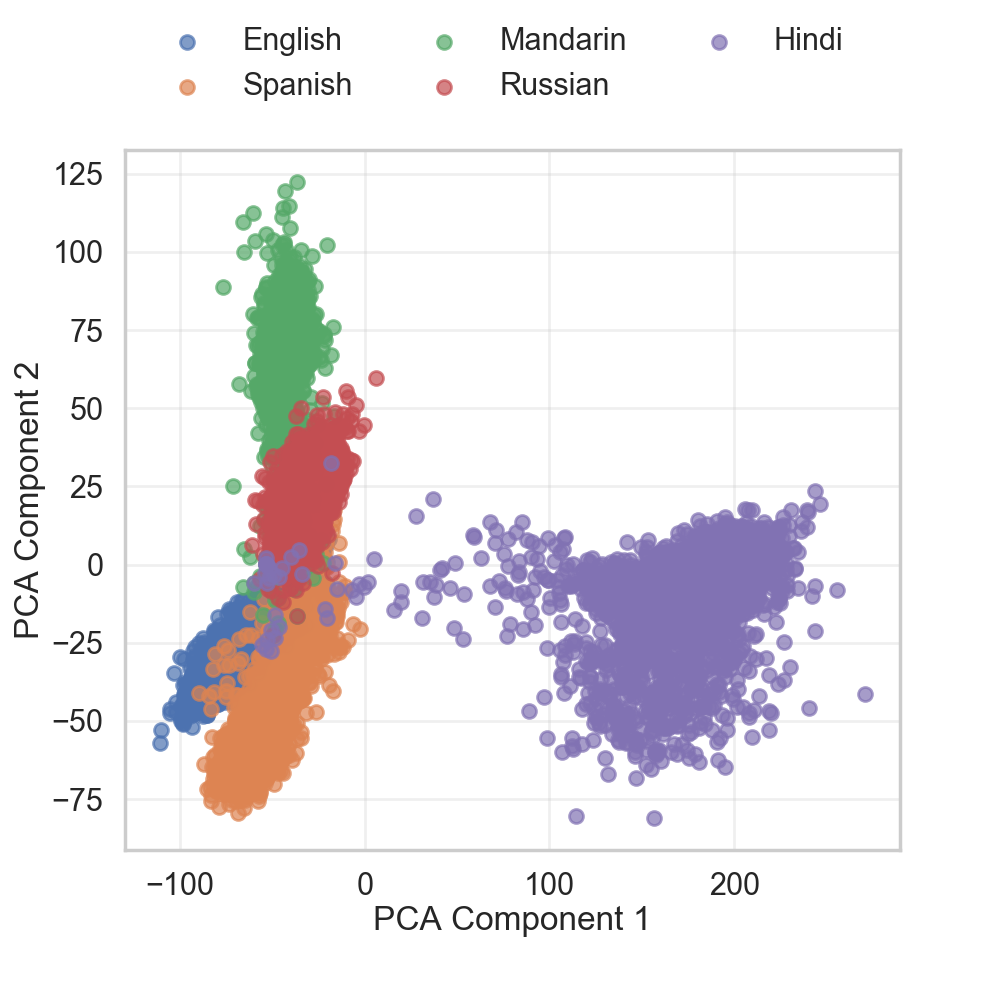

In [6]:
from core.gather_data.hidden_space import collect_hidden_space_by_language
from core.preprocess_data.flores_plus import load_flores_plus
from core.steering.pca import PCASteering
from core.visualize.visualize_explained_variance import visualize_explained_variance
from core.visualize.visualize_projections import visualize_projections

train_df, test_df = load_flores_plus(
    ["eng_Latn", "spa_Latn", "cmn_Hans", "rus_Cyrl", "hin_Deva"],
    {
        "eng_Latn": "English",
        "spa_Latn": "Spanish",
        "cmn_Hans": "Mandarin",
        "rus_Cyrl": "Russian",
        "hin_Deva": "Hindi",
    },
    train_size=100,
)

test_df = test_df[:100]

hidden_space_by_language_train, token_map_for_language_train = collect_hidden_space_by_language(
    model, tokenizer, train_df, skip_first=True
)
hidden_space_by_language_test, token_map_for_language_test = collect_hidden_space_by_language(
    model, tokenizer, test_df, skip_first=True
)

pca_steering = PCASteering().fit(hidden_space_by_language_train)
visualize_explained_variance(
    pca_steering.explained_variance_ratios, save_to="../../../artifacts/language_map/multi/gemma"
)

projections_train = pca_steering.project(hidden_space_by_language_train)
visualize_projections(hidden_space_by_language_train, token_map_for_language_train, projections_train, tokenizer)

projections_test = pca_steering.project(hidden_space_by_language_test)
visualize_projections(
    hidden_space_by_language_test,
    token_map_for_language_test,
    projections_test,
    tokenizer,
    save_to="../../../artifacts/language_map/multi/gemma",
)